In [1]:
import pickle, os
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import numpy as np
import pandas as pd

In [2]:
# load files
filenames = sorted(['distributions/' + name for name in os.listdir('distributions')])
dist_weeks = []
for name in filenames:
    with open(name, 'rb') as f:
        dist_weeks.append(pickle.load(f))
        

In [3]:
list(dist_weeks[0][0].keys())[-10:]

['sro 202',
 'sro',
 '202',
 'corona',
 'cases',
 'amp',
 'positive cases',
 'cases https',
 'govt',
 '19 cases']

In [4]:
list(dist_weeks[0][0].items())[-10:]

[('sro 202', 0.19681166887215318),
 ('sro', 0.19688893992298157),
 ('202', 0.19940596911393912),
 ('corona', 0.20171979811096383),
 ('cases', 0.2019663614365897),
 ('amp', 0.20295517182897857),
 ('positive cases', 0.20357092663955295),
 ('cases https', 0.22380187404889926),
 ('govt', 0.22486123784701204),
 ('19 cases', 0.236017244759595)]

In [5]:
# check topical drift
# set comparison on top 20 words
co_mat = np.empty((20,20))
for i in range(len(dist_weeks[0])):
    for j in range(len(dist_weeks[0])):
        co_mat[i,j] = len(set(list(dist_weeks[2][i].keys())[-20:]) - set(list(dist_weeks[1][j].keys())[-20:]))

pd.DataFrame(co_mat) # Topics don't correspond at all

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,19.0,20.0,20.0,20.0,20.0,20.0,16.0,19.0,16.0,20.0,19.0,20.0,20.0,19.0,20.0,20.0,20.0,20.0,19.0,20.0
1,19.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,18.0,18.0,20.0,20.0,20.0,20.0,20.0,18.0
2,20.0,20.0,20.0,20.0,19.0,19.0,20.0,19.0,20.0,20.0,20.0,20.0,20.0,20.0,16.0,20.0,20.0,20.0,20.0,20.0
3,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,17.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0
4,19.0,20.0,20.0,20.0,20.0,19.0,19.0,20.0,15.0,20.0,20.0,20.0,20.0,20.0,19.0,19.0,20.0,20.0,19.0,20.0
5,19.0,18.0,20.0,20.0,19.0,19.0,20.0,20.0,20.0,17.0,20.0,18.0,20.0,20.0,20.0,19.0,20.0,20.0,18.0,20.0
6,20.0,20.0,15.0,20.0,20.0,20.0,20.0,17.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,19.0
7,19.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,14.0,20.0,15.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0
8,20.0,18.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,19.0,19.0,20.0,20.0,20.0,20.0,19.0,20.0,20.0,20.0
9,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,19.0,20.0,19.0,17.0,20.0,20.0


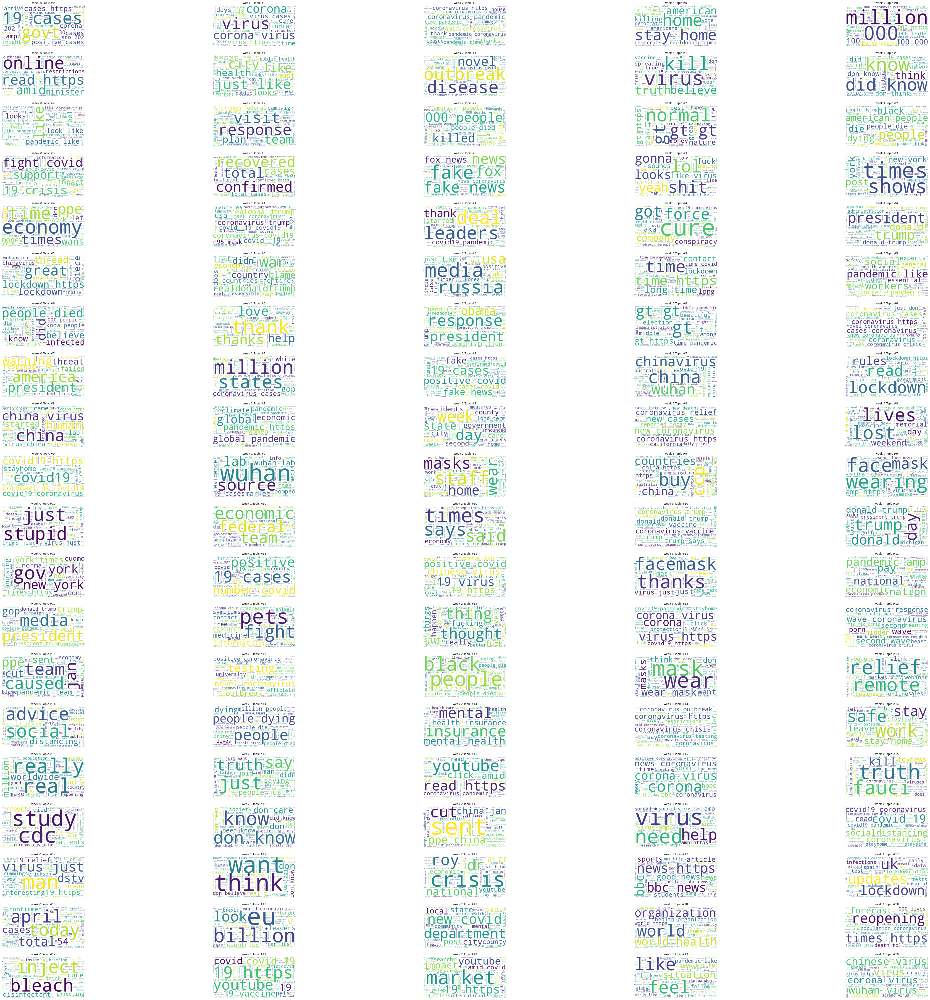

In [6]:
# dispay topic wordclouds
fig, axs = plt.subplots(len(dist_weeks[0]),len(dist_weeks), figsize=(80, 80), facecolor='w', edgecolor='k')
# fig.subplots_adjust(hspace = .5, wspace=.001)
plt.axis("off")
    
# axs = axs.ravel()
for week in range(len(dist_weeks)):
    for t in range(len(dist_weeks[0])):
        # axs[t].figure()
        axs[t,week].axis("off")
        # axs[t].title("Topic #" + str(t))
        axs[t,week].imshow(WordCloud(background_color='white').fit_words(dist_weeks[week][t]))
        axs[t,week].set_title("week " + str(week) + " Topic #" + str(t))

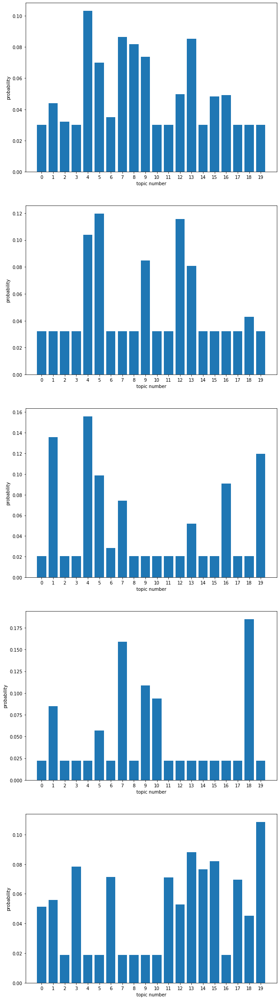

In [25]:
# plot distribution over topics of #ChineseVirus

fig, axs = plt.subplots(len(dist_weeks),1, figsize=(10, 40))#, facecolor='w', edgecolor='k')

    
# axs = axs.ravel()
for week in range(len(dist_weeks)):
    
    scores = [dist_weeks[week][i]['chinesevirus'] for i in range(len(dist_weeks[0]))]
    axs[week].bar(range(len(dist_weeks[0])), scores)
    axs[week].set_xticks(range(len(dist_weeks[0])))
    axs[week].set_ylabel('probability')
    axs[week].set_xlabel('topic number')
    axs[week].set_xlabel('topic number')
        

In [ ]:
# twist my brain over how to organize these plots in a plt.subplot ?
bar(range(total_topics), scores)
xticks(range(total_topics))
ylabel('probability')
xlabel('topic number')